In [2]:
from fullwaveqc import tools, geom, siganalysis, inversion, visual
import numpy as np
import matplotlib.pyplot as plt
import copy
import warnings

warnings.filterwarnings("ignore")
%reload_ext autoreload
plt.rcParams.update({'font.size': 18})

In [3]:
path    = "/geophysics2/dpelacani/PROJECTS/SEQBASE25_18/"
shot_no = 200                    # for amplitude plotting
x_list  = [6000, 9000]          # for vp-well plotting

# The true model

In [7]:
TRUE_BASE = tools.load("/geophysics2/dpelacani/true_models/Base/TRUE_enl_Vp_bl_y6250.sgy", model=True, verbose=1)
TRUE_BASE.dx=2.
TRUE_MON = tools.load("/geophysics2/dpelacani/true_models/Monitor/TRUE_enl_Vp_mon_y6250.sgy", model=True, verbose=1)
TRUE_MON.dx = 2.


2019-08-14 08:14:58.219749 	 Opening file /geophysics2/dpelacani/true_models/Base/TRUE_enl_Vp_bl_y6250.sgy...
2019-08-14 08:14:58.224188 	 Reading model...
2019-08-14 08:14:58.614261 	 Successfully loaded model of size 2500 x 8245!
2019-08-14 08:14:58.634518 	 Opening file /geophysics2/dpelacani/true_models/Monitor/TRUE_enl_Vp_mon_y6250.sgy...
2019-08-14 08:14:58.637679 	 Reading model...
2019-08-14 08:14:59.055745 	 Successfully loaded model of size 2500 x 8245!

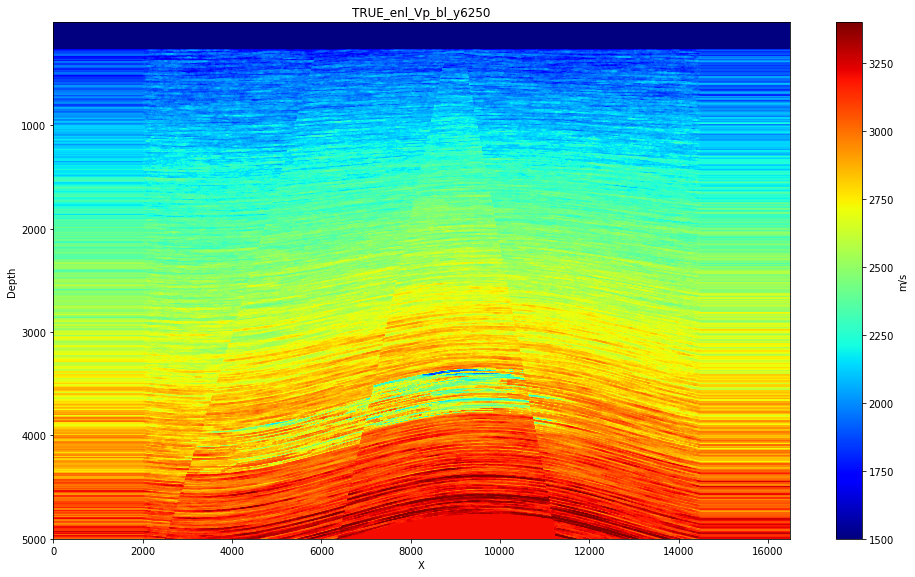

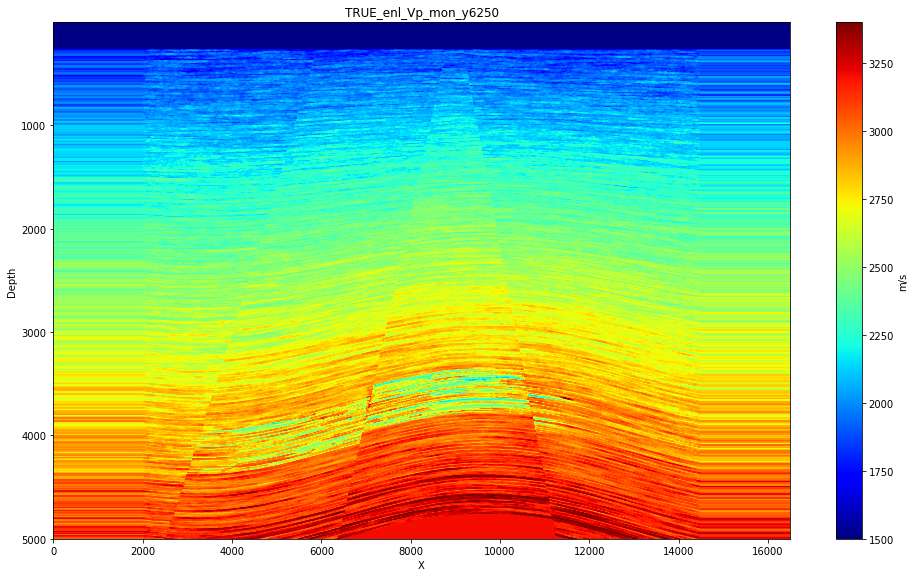

In [4]:
# Visualise true model
visual.vpmodel(TRUE_BASE, vmin=1500, vmax=3400)
visual.vpmodel(TRUE_MON, vmin=1500, vmax=3400)

In [5]:
print(TRUE_BASE.attr())

{'name': 'TRUE_enl_Vp_bl_y6250', '_type': 'model', 'filepath': '/geophysics2/dpelacani/true_models/Base/TRUE_enl_Vp_bl_y6250.sgy', 'dx': 2.0, 'nx': 8245, 'nz': 2500, 'minvp': 1473.3582, 'maxvp': 3656.3013, 'data': array([[3023.0723, 3023.0723, 3023.0723, ..., 3141.815 , 3141.815 ,
        3141.815 ],
       [3022.6118, 3022.6118, 3022.6118, ..., 3167.3213, 3167.3213,
        3167.3213],
       [3023.3853, 3023.3853, 3023.3853, ..., 3195.5962, 3195.5962,
        3195.5962],
       ...,
       [1500.    , 1500.    , 1500.    , ..., 1500.    , 1500.    ,
        1500.    ],
       [1500.    , 1500.    , 1500.    , ..., 1500.    , 1500.    ,
        1500.    ],
       [1500.    , 1500.    , 1500.    , ..., 1500.    , 1500.    ,
        1500.    ]], dtype=float32)}


# The starting model


2019-08-22 13:41:26.746575 	 Opening file /geophysics2/dpelacani/PROJECTS/PARBASE25_18/PARBASE25_18-CP00130-Vp.sgy...
2019-08-22 13:41:26.753841 	 Reading model...
2019-08-22 13:41:26.785740 	 Successfully loaded model of size 201 x 661!

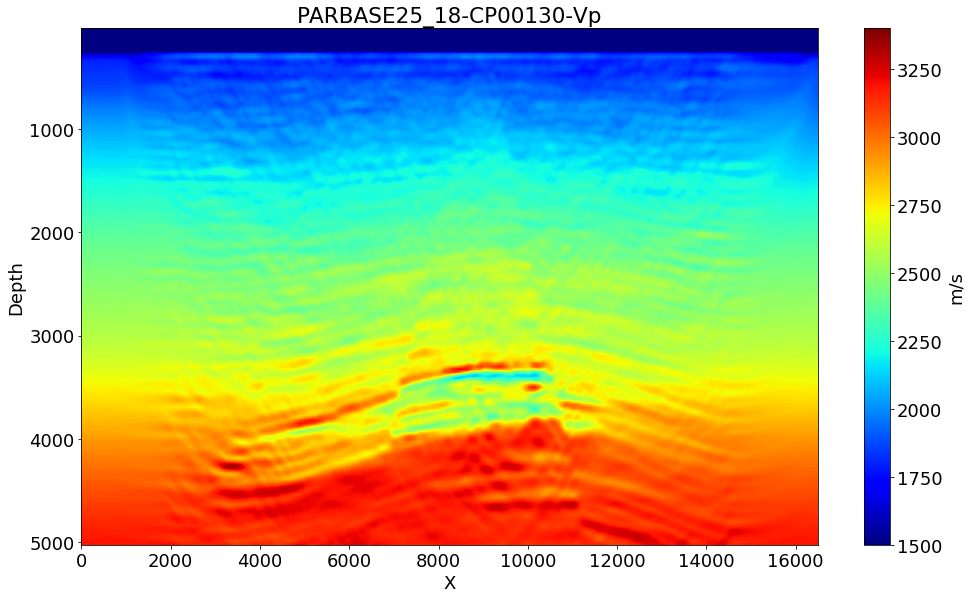

In [4]:
# PARBASE25_18 -- Iteration 130
CP18 = tools.load("/geophysics2/dpelacani/PROJECTS/PARBASE25_18/PARBASE25_18-CP00130-Vp.sgy", model=True)
visual.vpmodel(CP18, vmin=1500, vmax=3400, cap=0.0, units="m/s", save=False)


2019-08-14 08:19:28.435082 	 Reading file /geophysics2/dpelacani/PROJECTS/PARBASE25_18/PARBASE25_18-CP00130-Vp.sgy...
2019-08-14 08:19:28.435204 	 Creating new file  at /geophysics2/dpelacani/PROJECTS/SEQBASE25_18/SEQBASE25_18-StartVp.sgy...
2019-08-14 08:19:28.613536 	 Stacking data ...
2019-08-14 08:19:28.627714 	 Updating model ...
2019-08-14 08:19:28.669797 	 Smoothed model saved!

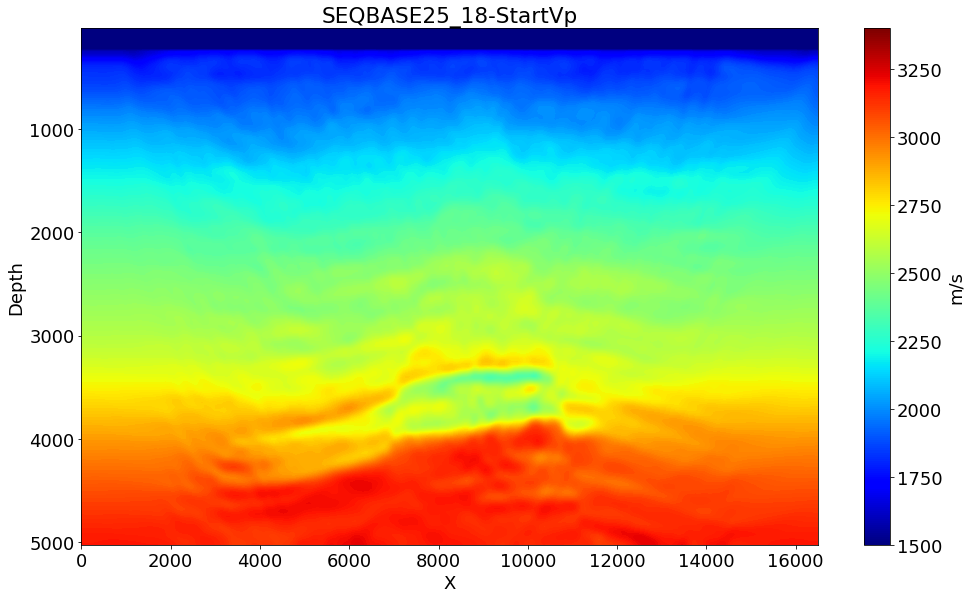

In [32]:
# Apply smoothing to CP18 and save as starting model for SEQBASE25_18
s = tools.smooth_model(CP18, strength=[2,2], slowness=True, save=True, 
                       save_path=path, name="SEQBASE25_18-StartVp", w=[9, None, None, None])
visual.vpmodel(s, vmin=1500, vmax=3400 )


2019-08-14 08:20:13.326343 	 Opening file /geophysics2/dpelacani/PROJECTS/SEQBASE25_18/SEQBASE25_18-StartVp.sgy...
2019-08-14 08:20:13.329407 	 Reading model...
2019-08-14 08:20:13.337370 	 Successfully loaded model of size 201 x 661!{'name': 'SEQBASE25_18-StartVp', '_type': 'model', 'filepath': '/geophysics2/dpelacani/PROJECTS/SEQBASE25_18/SEQBASE25_18-StartVp.sgy', 'dx': 25, 'nx': 661, 'nz': 201, 'minvp': 1500.0, 'maxvp': 3234.03, 'data': array([[3180.6177, 3180.6033, 3180.5784, ..., 3181.156 , 3181.1345,
        3181.1238],
       [3179.5574, 3179.5474, 3179.531 , ..., 3180.202 , 3180.1719,
        3180.1562],
       [3177.513 , 3177.512 , 3177.5112, ..., 3178.3518, 3178.3054,
        3178.281 ],
       ...,
       [1500.    , 1500.    , 1500.    , ..., 1500.    , 1500.    ,
        1500.    ],
       [1500.    , 1500.    , 1500.    , ..., 1500.    , 1500.    ,
        1500.    ],
       [1500.    , 1500.    , 1500.    , ..., 1500.    , 1500.    ,
        1500.    ]], dtype=float32

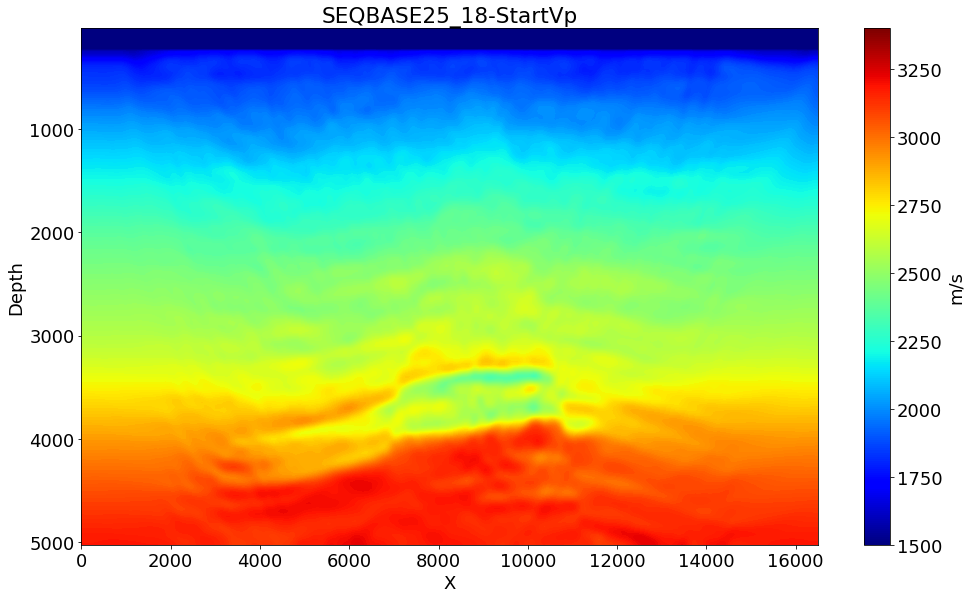

In [36]:
# Load starting model and double check saving occurred fine
start_model_path = path + "SEQBASE25_18-StartVp.sgy"
START_MODEL = tools.load(start_model_path, model=True)
print(START_MODEL.attr())
START_MODEL.dx = 25.
visual.vpmodel(START_MODEL, vmin=1500, vmax=3400, cap=0.0, units="m/s", save=False)

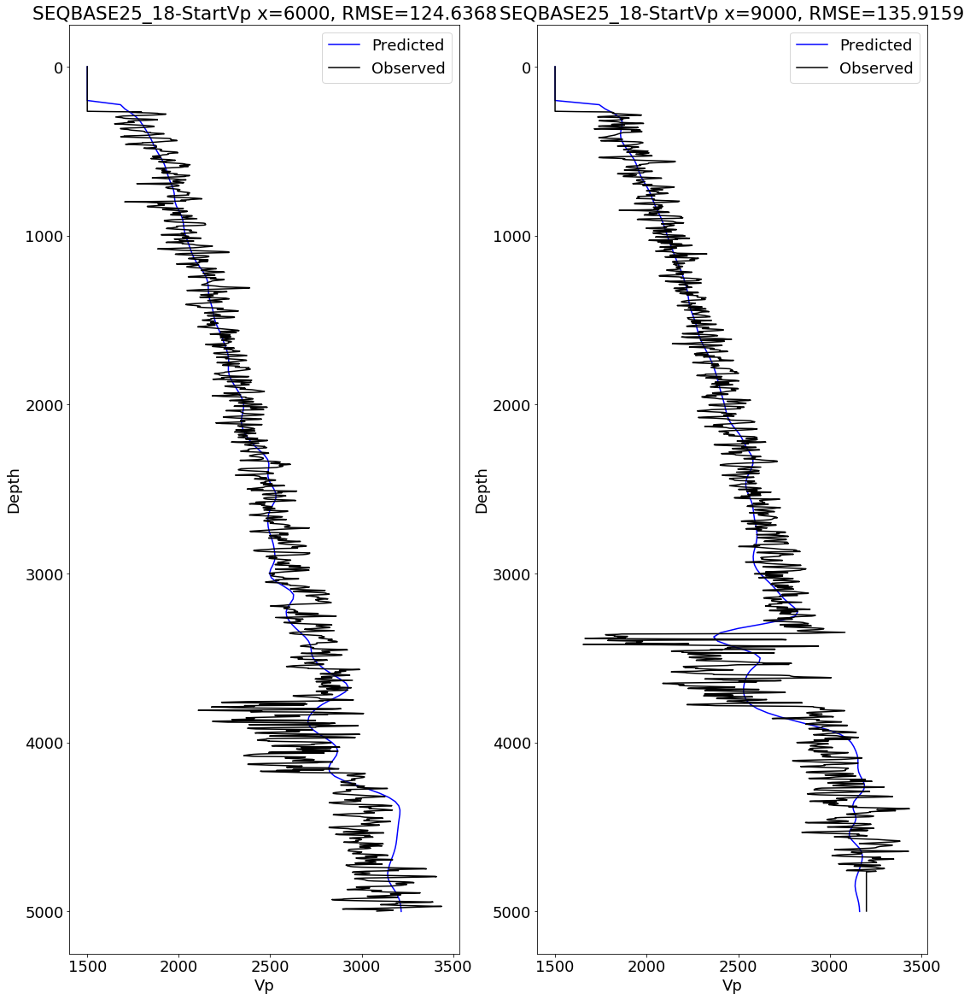

In [37]:
# Plot Vp logs of starting and true models
wells_start = visual.vpwell(START_MODEL, pos_x=x_list, TrueModel=TRUE_BASE, plot=True)

# Boundary Calculation and QC on SegyPrep Alignment

In [40]:
# Calculating number of absorbing boundarie cells and number of cells required 
# to distance the source from the absorbing boundaries
n_abs, n_dist = geom.boundarycalc(d=190, dx=25., fmin=3., vmax=3700)
print("Number of absorbing boundary cells   : ", n_abs)
print("Number of cells from source (Fresnel): ", n_dist)

Number of absorbing boundary cells   :  99
Number of cells from source (Fresnel):  10


2019-08-14 08:20:39.842594 	                          Plotting ...     

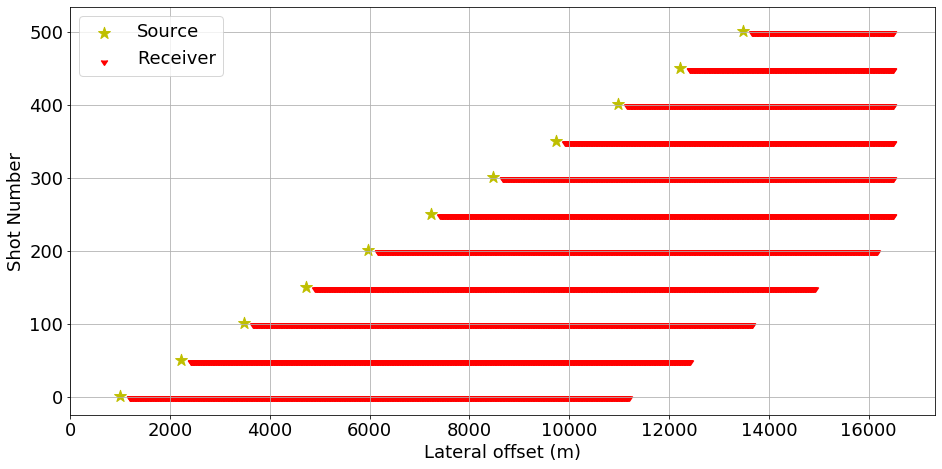

11


In [41]:
# Visualising (some) sources and receivers positions as understood from segyprep
rcvgeopath = path + "SEQBASE25_18-Receivers.geo"
srcgeopath = path + "SEQBASE25_18-Sources.geo"
src_list=[i for i in range(0, 521, 50)]
print(len(geom.surveygeom(rcvgeopath, srcgeopath, src_list, plot=True, verbose=1)[1]))

# Observed Data (with +2ms delay)

In [42]:
OBS_BASE_DATA = tools.load(path+"SEQBASE25_18-Observed.sgy", model=False, verbose=1)


2019-08-14 08:20:47.129256 	 Opening file /geophysics2/dpelacani/PROJECTS/SEQBASE25_18/SEQBASE25_18-Observed.sgy...
2019-08-14 08:20:47.145374 	 Loading data...
2019-08-14 08:21:38.745181 	 521 shots found. Loading headers...
2019-08-14 08:22:50.627504 	 322149 total traces read
2019-08-14 08:22:50.627905 	 Data loaded successfully

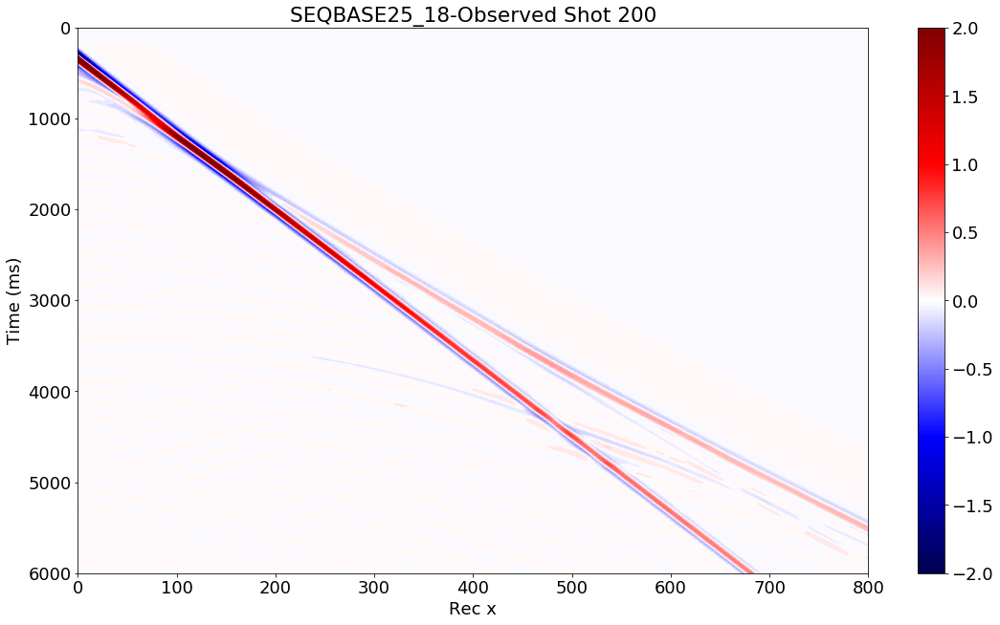

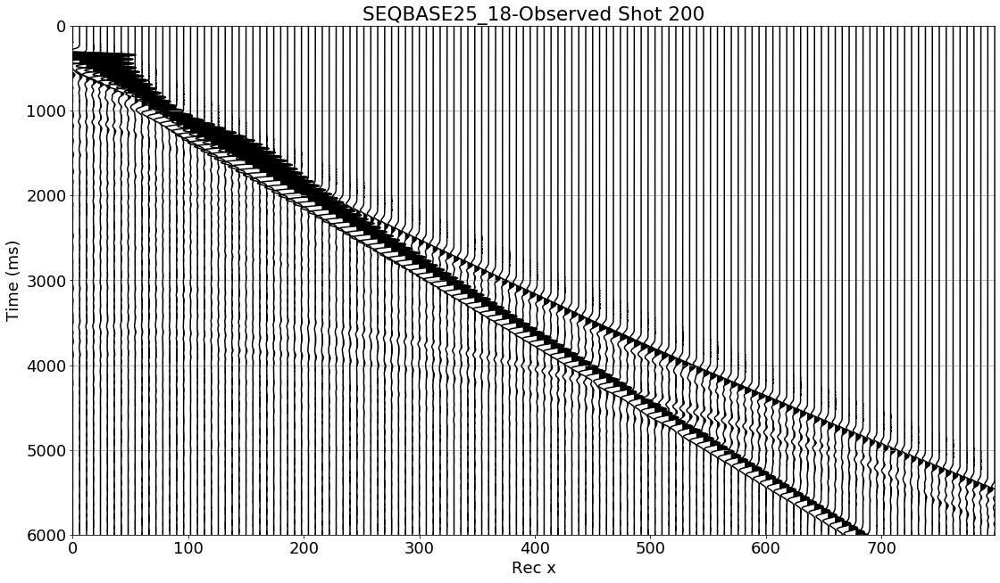

In [43]:
visual.amplitude(OBS_BASE_DATA, shot=shot_no, vmin=-2, vmax=2)
visual.wiggle(OBS_BASE_DATA, shot=shot_no, scale=14.5, skip_trace=5)

2019-08-14 08:23:19.155266 	 Sampling Frequency = 500.0000 Hz

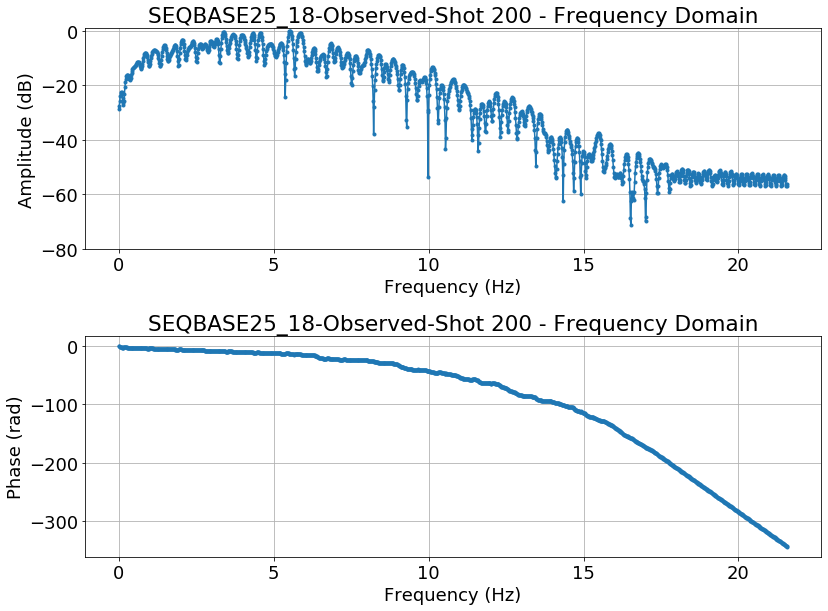

In [44]:
obs_spec = siganalysis.dataspec(OBS_BASE_DATA, shot=shot_no, ms=True, fmax=18, plot=True, fft_smooth=10)

# The wavelet


2019-08-14 08:23:54.730284 	 Opening file /geophysics2/dpelacani/PROJECTS/SEQBASE25_18/SEQBASE25_18-RawSign.sgy...
2019-08-14 08:23:54.731575 	 Loading data...
2019-08-14 08:23:54.732179 	 1 shots found. Loading headers...
2019-08-14 08:23:54.732550 	 1 total traces read
2019-08-14 08:23:54.732699 	 Data loaded successfully
2019-08-14 08:23:54.733187 	 Sampling Frequency = 1000.0000 Hz

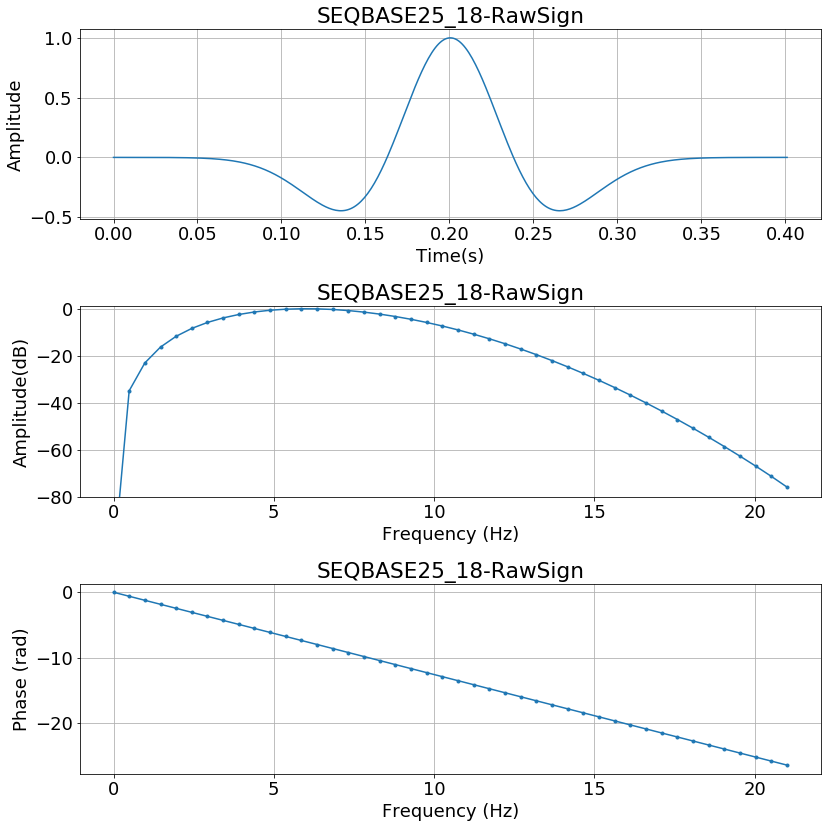


2019-08-14 08:23:55.764358 	 Opening file /geophysics2/dpelacani/PROJECTS/SEQBASE25_18/SEQBASE25_18-Signature.sgy...
2019-08-14 08:23:55.766440 	 Loading data...
2019-08-14 08:23:55.821466 	 1 shots found. Loading headers...
2019-08-14 08:23:55.824330 	 521 total traces read
2019-08-14 08:23:55.824492 	 Data loaded successfully

 [2000] [3.001]

2019-08-14 08:23:55.826388 	 Sampling Frequency = 500.0000 Hz

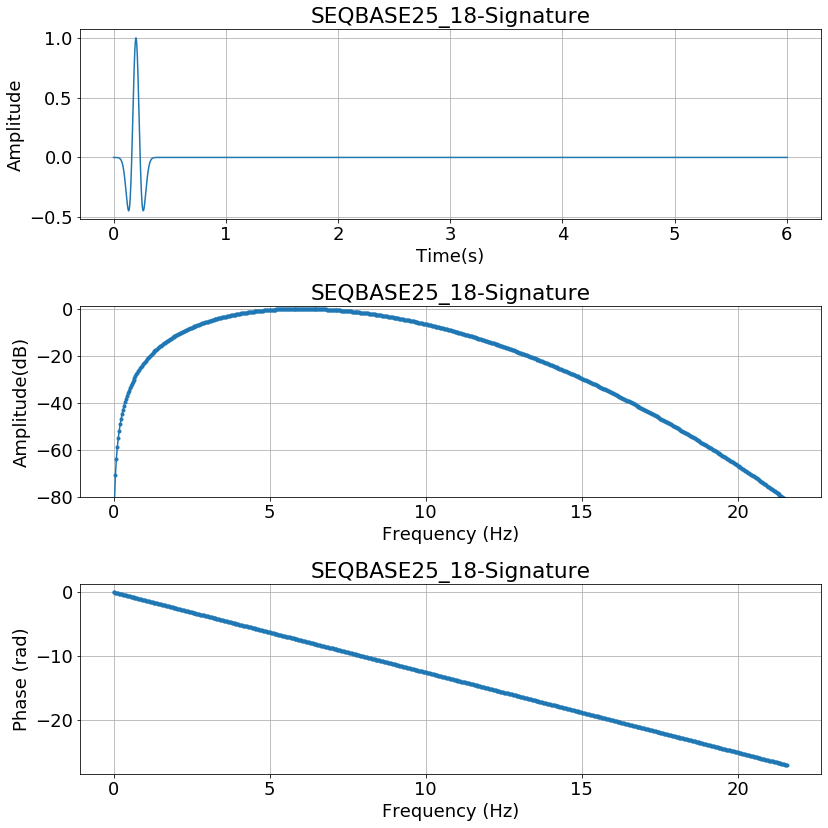

In [46]:
# Input wavelet
wavelet_path = path + "SEQBASE25_18-RawSign.sgy"
WAVELET = tools.load(wavelet_path, model=False)
WAVELET.samples = [401]
WAVELET.dt = [1.]
wavelet = siganalysis.wavespec(WAVELET, ms=True, fmax=18, plot=True, fft_smooth=5)

# Pre-processed wavelet
wavelet_path = path + "SEQBASE25_18-Signature.sgy"
WAVELET = tools.load(wavelet_path, model=False)
print("\n\n", WAVELET.attr("samples"), WAVELET.attr("dt"))
WAVELET.samples = [3001]
WAVELET.dt = [2.]

wavelet = siganalysis.wavespec(WAVELET, ms=True, fmax=18, plot=True, fft_smooth=5)

# The inverted model (SEQBASE25_18)

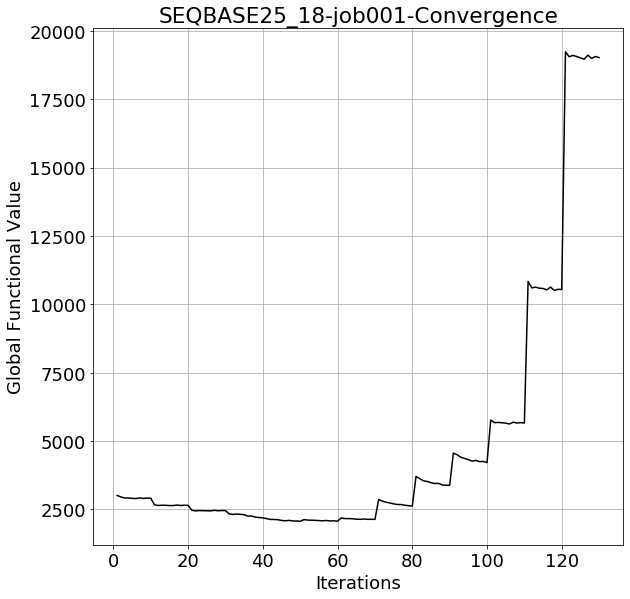

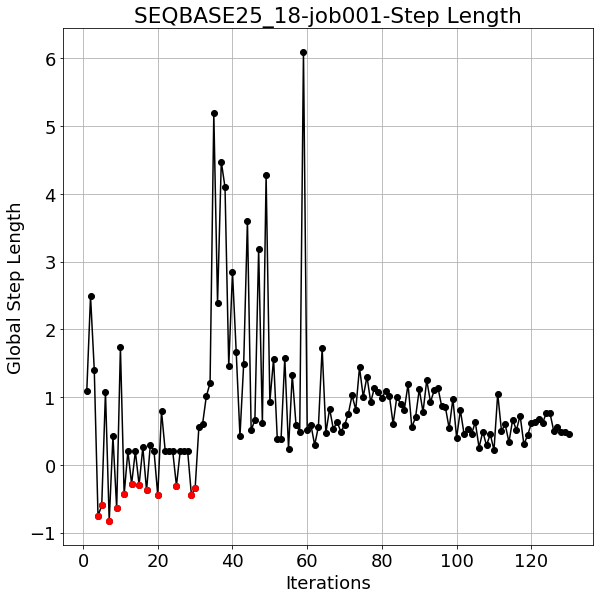

In [66]:
job_path = path + "SEQBASE25_18-job001.log"
_ = inversion.functional(job_path, plot=True)
_ = inversion.steplen(job_path, plot=True)


2019-08-14 13:33:23.856712 	 Opening file /geophysics2/dpelacani/PROJECTS/SEQBASE25_18/SEQBASE25_18-CP00130-Vp.sgy...
2019-08-14 13:33:23.861057 	 Reading model...
2019-08-14 13:33:23.883552 	 Successfully loaded model of size 201 x 661!

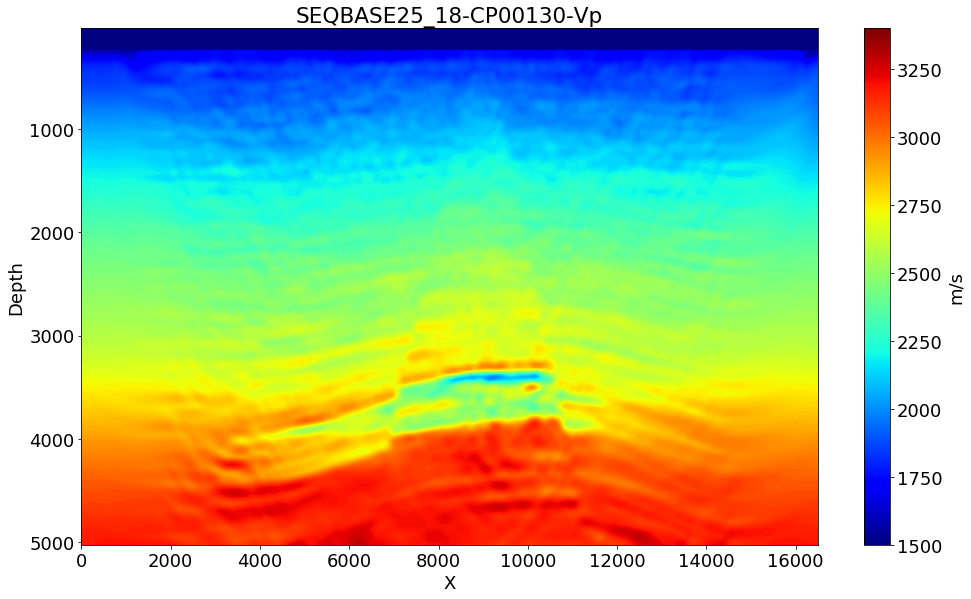

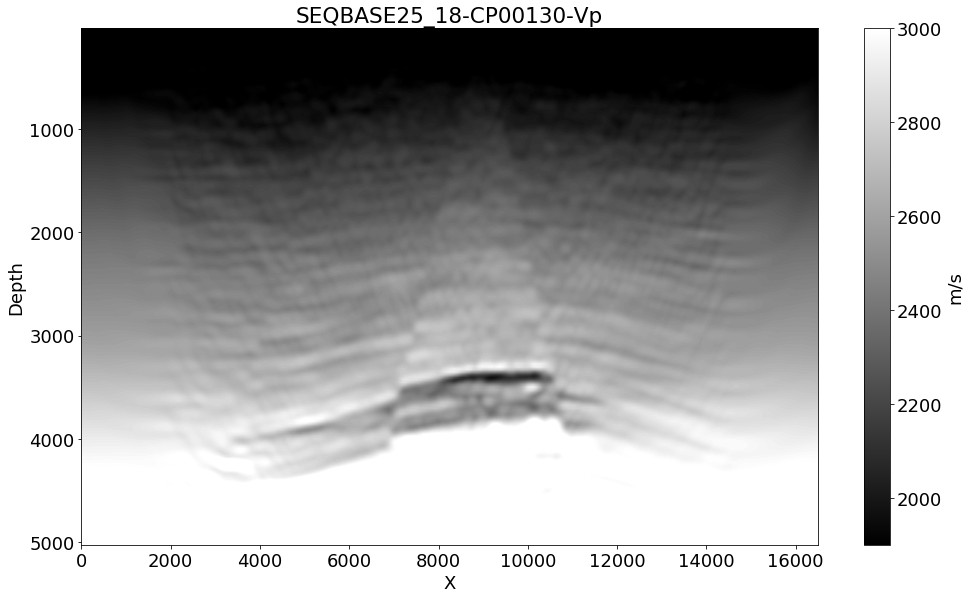

In [68]:
model_path = path + "SEQBASE25_18-CP00130-Vp.sgy"
SQ18 = tools.load(model_path, model=True, verbose=1)
visual.vpmodel(SQ18, vmin=1500, vmax=3400)
visual.vpmodel(SQ18, vmin=1900, vmax=3000, cmap="gray")

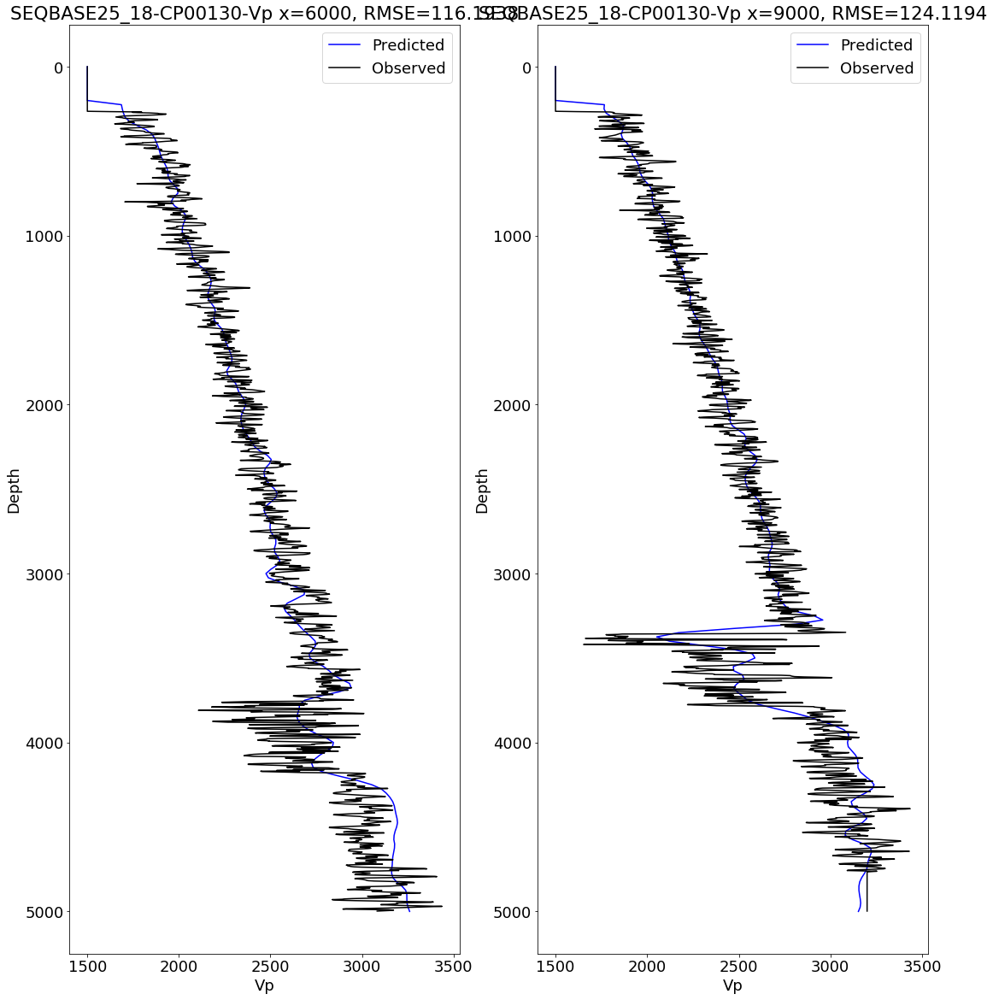

In [71]:
# Plot Vp logs of predicted and true models
wells_cp = visual.vpwell(SQ18, pos_x=x_list, TrueModel=TRUE_BASE, plot=True)

In [72]:
visual.animateinv(it_max=130, path=path, project_name="SEQBASE25_18", vmin=1500, vmax=3400, verbose=1)

2019-08-14 13:34:46.116734 	 Loading model 130 ...
2019-08-14 13:34:46.116829 	 Creating animation...

# SEQMON25_18

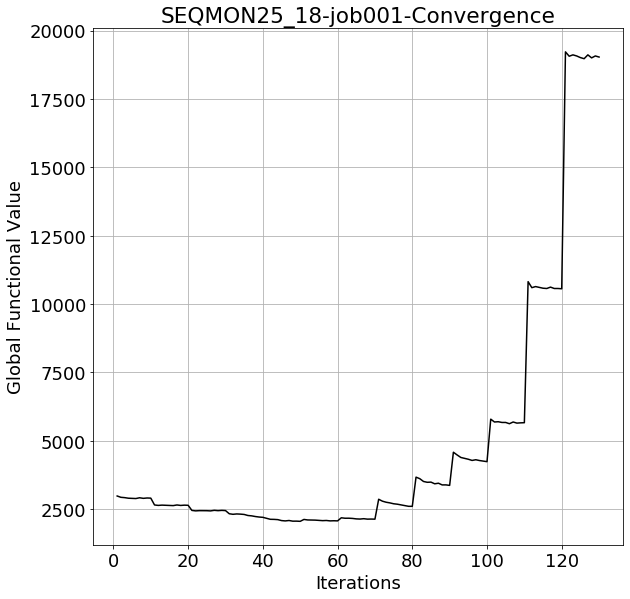

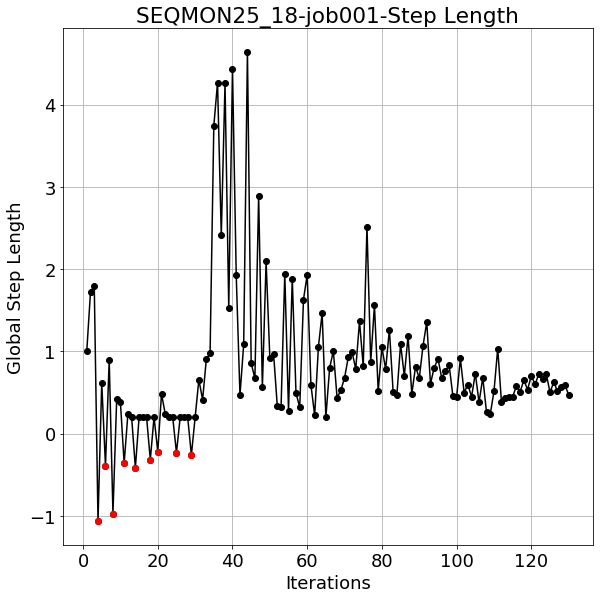

In [75]:
job_path = "/geophysics2/dpelacani/PROJECTS/SEQMON25_18/SEQMON25_18-job001.log"
_ = inversion.functional(job_path, plot=True)
_ = inversion.steplen(job_path, plot=True)

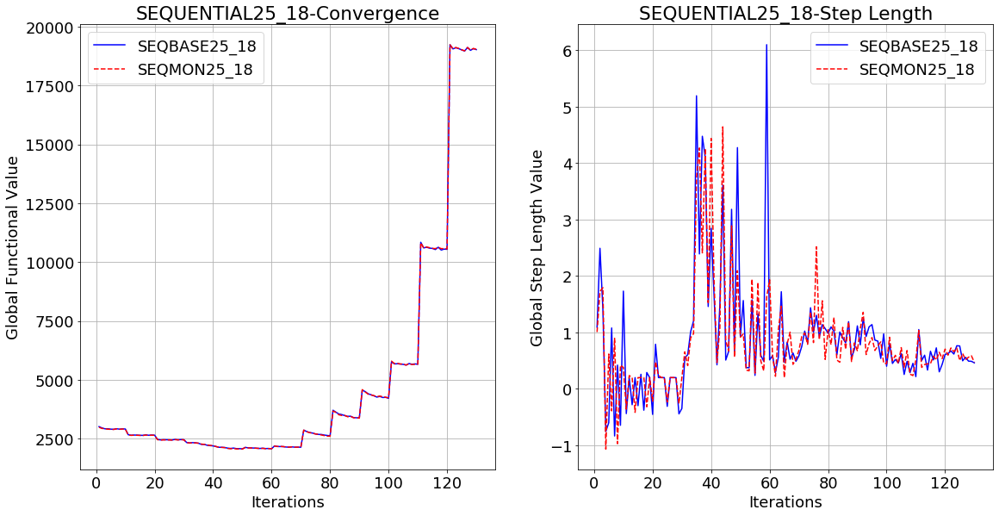

In [78]:
BASEFUNC18=inversion.functional("/geophysics2/dpelacani/PROJECTS/SEQBASE25_18/SEQBASE25_18-job001.log")
MONFUNC18=inversion.functional("/geophysics2/dpelacani/PROJECTS/SEQMON25_18/SEQMON25_18-job001.log")
BASESTEP18=inversion.steplen("/geophysics2/dpelacani/PROJECTS/SEQBASE25_18/SEQBASE25_18-job001.log")
MONSTEP18=inversion.steplen("/geophysics2/dpelacani/PROJECTS/SEQMON25_18/SEQMON25_18-job001.log")
figure, ax = plt.subplots(1, 2)
figure.set_size_inches(19, 9.5)
ax[0].plot(BASEFUNC18[0], BASEFUNC18[1], 'b-', label="SEQBASE25_18")
ax[0].plot(MONFUNC18[0], MONFUNC18[1], 'r--', label="SEQMON25_18")
ax[0].set_xlabel("Iterations")
ax[0].set_ylabel("Global Functional Value")
ax[0].set_title("SEQUENTIAL25_18" + "-Convergence")
ax[0].grid(True)
ax[0].legend(loc="best")
ax[1].plot(BASESTEP18[0], BASESTEP18[1], 'b-', label="SEQBASE25_18")
ax[1].plot(MONSTEP18[0], MONSTEP18[1], 'r--', label="SEQMON25_18")
ax[1].set_xlabel("Iterations")
ax[1].set_ylabel("Global Step Length Value")
ax[1].set_title("SEQUENTIAL25_18" + "-Step Length")
ax[1].grid(True)
ax[1].legend(loc="best")
plt.show()


2019-08-14 13:36:09.786491 	 Opening file /geophysics2/dpelacani/PROJECTS/SEQMON25_18/SEQMON25_18-CP00130-Vp.sgy...
2019-08-14 13:36:09.817939 	 Reading model...
2019-08-14 13:36:09.835123 	 Successfully loaded model of size 201 x 661!

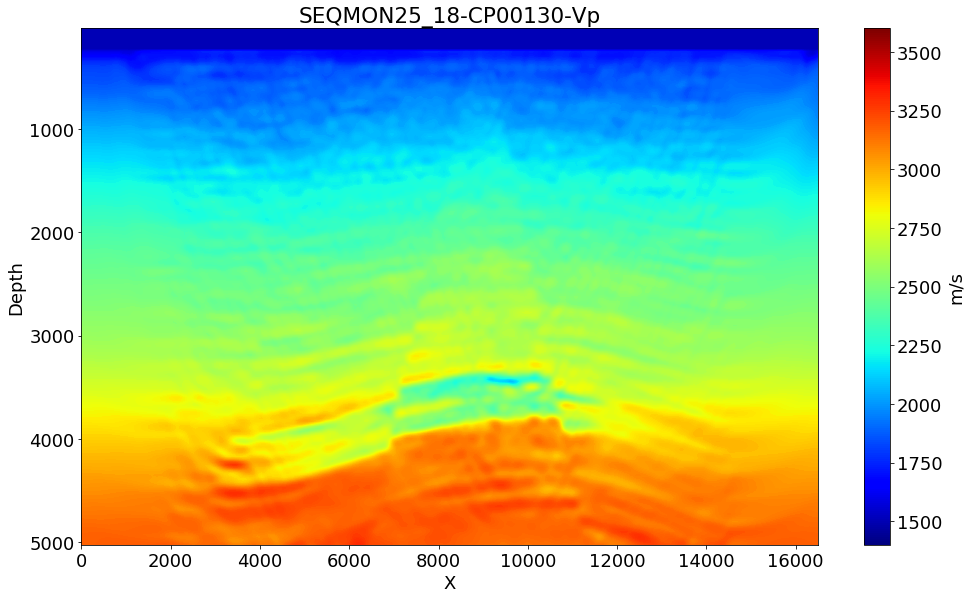

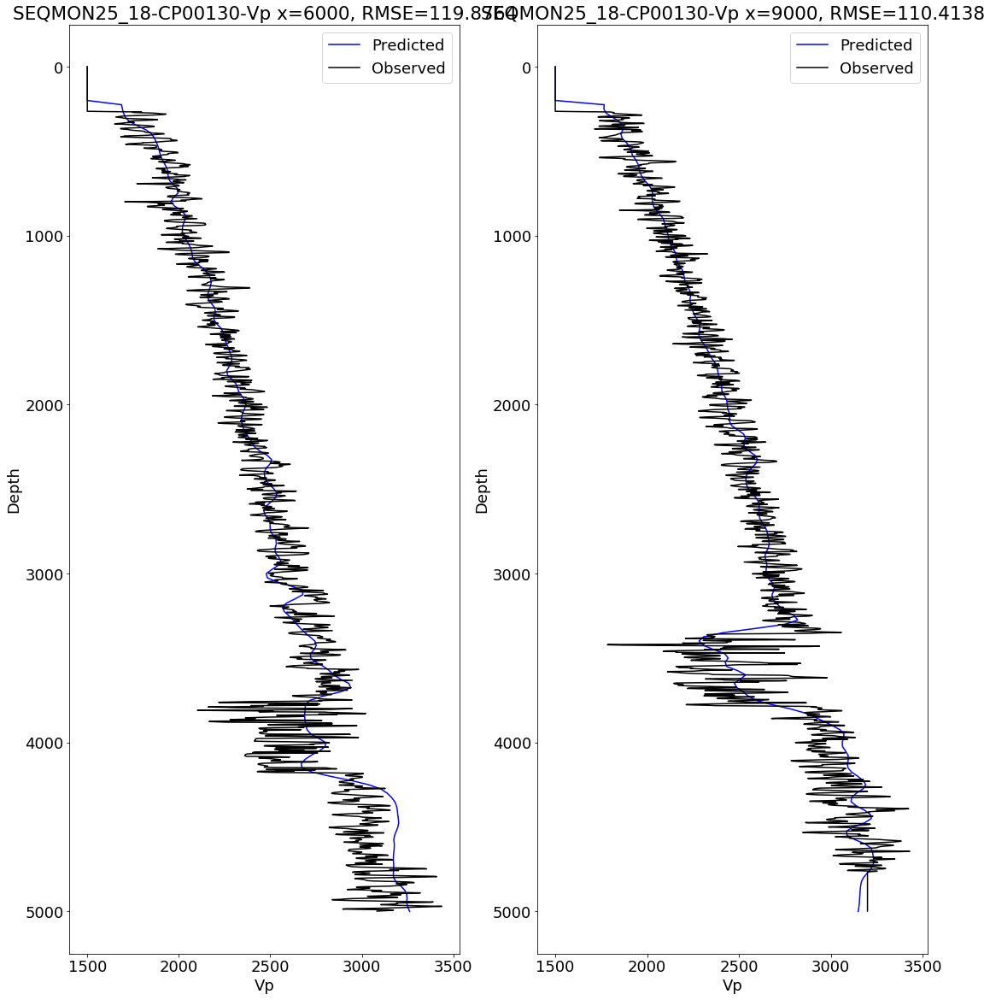

In [79]:
mon_path = "/geophysics2/dpelacani/PROJECTS/SEQMON25_18/SEQMON25_18-CP" + format(130, "05") + "-Vp.sgy"
SQMON17 = tools.load(mon_path, model=True, verbose=1)
visual.vpmodel(SQMON17, vmin=1400, vmax=3600)
_ = visual.vpwell(Model=SQMON17, pos_x=x_list, TrueModel=TRUE_MON, plot=True)

# Sequential Difference (SEQDIFF25_17)

In [48]:
TRUE_DIFF = copy.deepcopy(TRUE_BASE)
TRUE_DIFF.name = "TRUE_DIFF"
TRUE_DIFF.data = TRUE_MON.data - TRUE_BASE.data

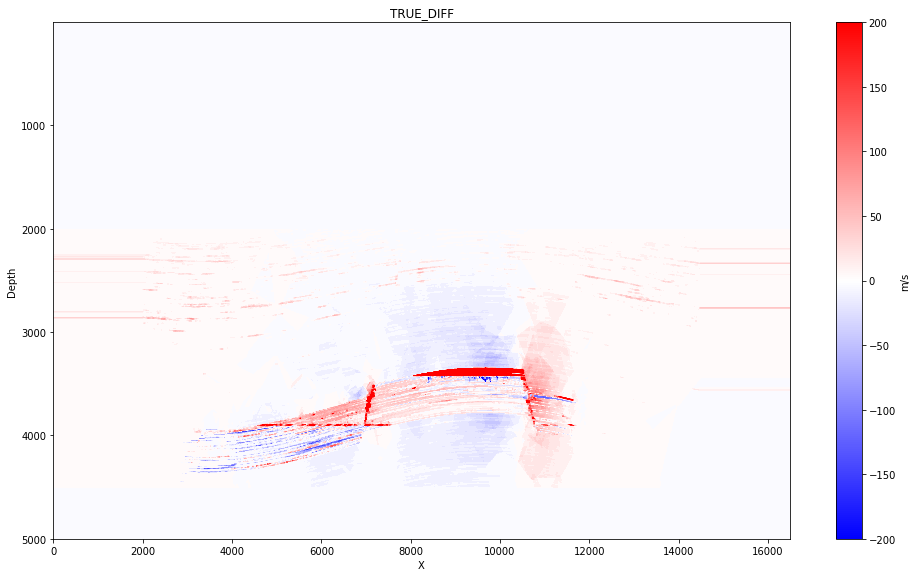

In [56]:
visual.vpmodel(TRUE_DIFF, cmap="bwr", vmin=-200, vmax=200)


2019-08-14 13:36:25.949921 	 Opening file /geophysics2/dpelacani/PROJECTS/SEQBASE25_18/SEQBASE25_18-CP00130-Vp.sgy...
2019-08-14 13:36:25.952131 	 Reading model...
2019-08-14 13:36:25.960002 	 Successfully loaded model of size 201 x 661!
2019-08-14 13:36:25.960627 	 Opening file /geophysics2/dpelacani/PROJECTS/SEQMON25_18/SEQMON25_18-CP00130-Vp.sgy...
2019-08-14 13:36:25.962511 	 Reading model...
2019-08-14 13:36:25.972145 	 Successfully loaded model of size 201 x 661!

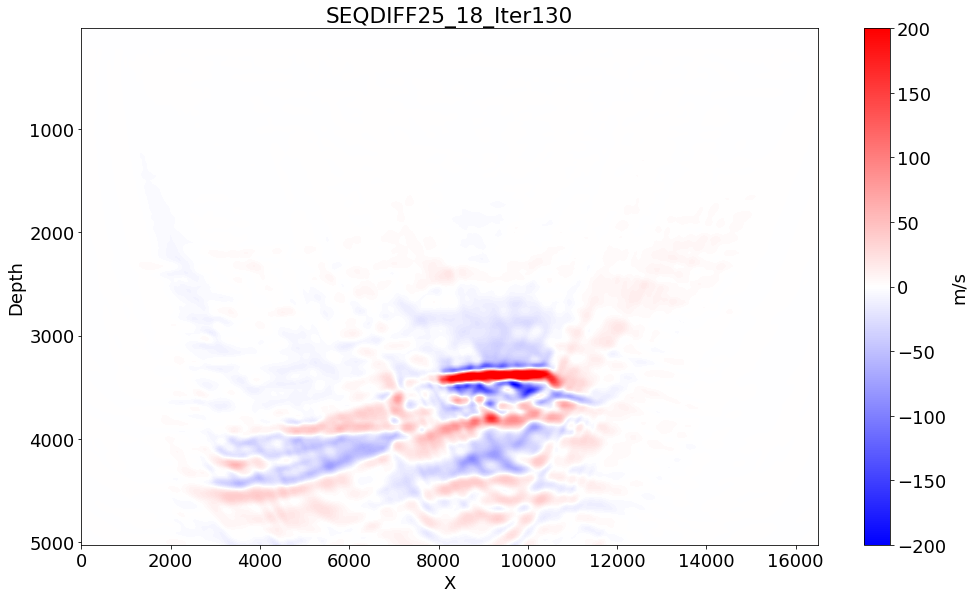

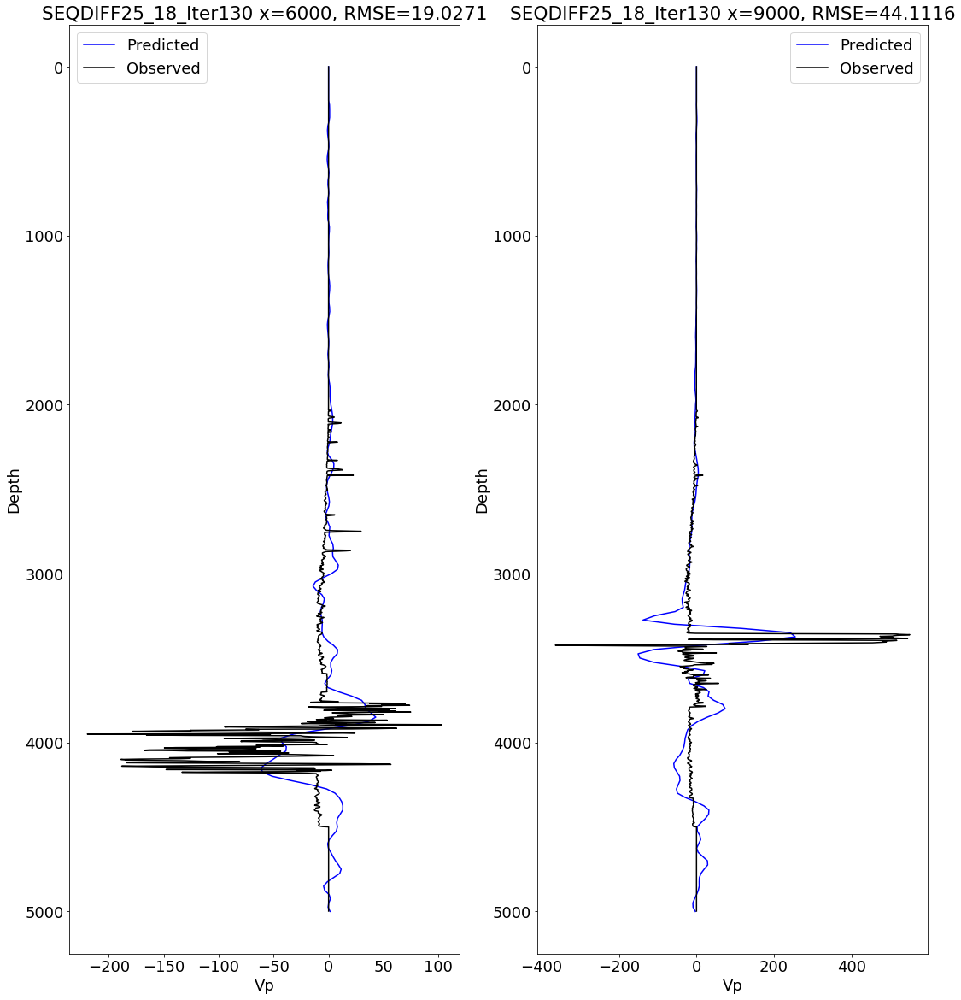

In [80]:
it = 130
base_path = "/geophysics2/dpelacani/PROJECTS/SEQBASE25_18/SEQBASE25_18-CP" + format(it, "05") + "-Vp.sgy"
mon_path = "/geophysics2/dpelacani/PROJECTS/SEQMON25_18/SEQMON25_18-CP" + format(it, "05") + "-Vp.sgy"
CPBASE17 = tools.load(base_path, model=True, verbose=1)
CPMON17 = tools.load(mon_path, model=True, verbose=1)
CPDIFF17 = copy.deepcopy(CPBASE17)
CPDIFF17.name = "SEQDIFF25_18_Iter%g" % it
CPDIFF17.data = CPMON17.data - CPBASE17.data

visual.vpmodel(CPDIFF17, cmap="bwr", vmin=-200, vmax=200)
_ = visual.vpwell(Model=CPDIFF17, pos_x=x_list , TrueModel=TRUE_DIFF, plot=True)